# Finalizing the coadd sample
### This sample will potentially be used in a short ApJ Letter as well as follow up with MANGA

10-8-16 Claudia and I looked at all the coadd images (in /documents/) and picked out those which were the best examples of clumpy galaxies for additional follow-up/study. 

What needs to be done:
    1. Isolate these galaxies from the FITS file containing all clumpy gals -- send coordinates to Chris?
    2. Download all available SDSS spectra for each galaxy
    3. Get all single-epoch imaging 
    4. Look at overall subject distributions

In [14]:
from astropy.table import Table, join
from astropy.coordinates import SkyCoord
from astropy import units as u
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline

In [15]:
# Import FITS file containing ALL clumpy gals (coadd, single) with associated SDSS metadata
data = Table.read('../data/gzh_sdss_strictclumpy_trueclumpy_sdssdata.fits')

In [16]:
coadd_mask = data['Table'] != 'sdss_single  '
coadd = data[coadd_mask]

## Remove duplicate galaxies

In [17]:
# Remove duplicates! (only)

c1 = SkyCoord(coadd['RA']*u.degree, coadd['DEC']*u.degree)
c2 = SkyCoord(coadd['RA']*u.degree, coadd['DEC']*u.degree)
idxc1, idxc2, d2d, d3d = c1.search_around_sky(c2, 25*u.arcsec)

print "These are the duplicate images in the coadd sample:"
print np.where(np.bincount(idxc1)>1)

coadd_dupes = np.array([6,14,15,32,40,47,61,71,76,101,103,104])

dupe_mask = np.ones(len(coadd), dtype='bool')
dupe_mask[coadd_dupes] = False

cc = coadd['RA','DEC'][dupe_mask]
# This csv file for finding associated spectra in CasJobs (ALL COADD CLUMPY)
cc.write('../data/gzh_nodupes_coadd_coordlist.csv',format='ascii.csv')

These are the duplicate images in the coadd sample:
(array([  5,   6,  13,  14,  15,  31,  32,  39,  40,  46,  47,  60,  61,
        70,  71,  75,  76, 100, 101, 102, 104]),)


## Remove all galaxies that don't match mine & Claudia's "doesn't look right" criterion

In [18]:
# Claudia and I went through and will exclude some objects which aren't very good clumpy examples
#  (exclude crappy clumps AND duplicates which aren't good coords for that obj)
exclude_idx = np.array([1,6,15,16,22,26,30,33,34,37,41,48,57,61,64,72,73,77,78,80,84,90,94,102,104,105])

exclude_mask = np.ones(len(coadd), dtype='bool')
exclude_mask[exclude_idx-1] = False

final_cc = coadd[exclude_mask]
# csv file for finding associated spectra in CasJobs  (FINAL SAMPLE COADD CLUMPY)
coords = final_cc['OBJID','RA','DEC']
coords.write('../data/gzh_nodupes_coadd_coordlist_finalsample.csv',format='ascii.csv')
final_cc.write('../data/gzh_nodupes_coadd_finalsample.fits',overwrite=True)

In [19]:
old_rcparams = dict(matplotlib.rcParams)  # this makes a *copy*

## Plot basic info of remaining galaxies (SDSS ancillary data from DR7?)

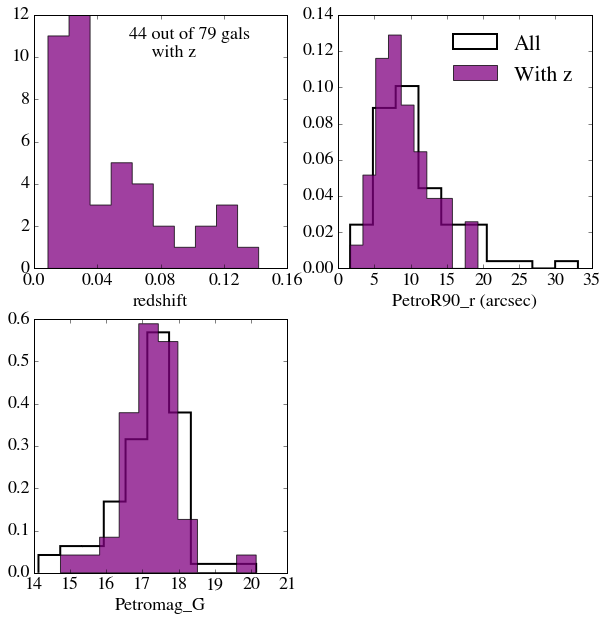

In [20]:
matplotlib.rcParams.update({'font.size': 18, 'font.family': 'STIXGeneral', 
                            'mathtext.fontset': 'stix'})

with_z = np.where(~np.isnan(final_cc['REDSHIFT']))

# Sample distributions
fig = plt.figure(figsize=(10,10))

ax = fig.add_subplot(221)
ax.hist(final_cc['REDSHIFT'][with_z], histtype='stepfilled', color='purple', alpha=.75)
ax.set_xlabel('redshift')
ax.set_xticks([0., 0.04, 0.08, 0.12, 0.16])
ax.set_xticklabels(['0.0', '0.04', '0.08', '0.12', '0.16'])
ax.text(0.06, 10, '{0} out of {1} gals \n     with z'.format(len(with_z[0]), len(final_cc)))

ax = fig.add_subplot(222)
ax.hist(final_cc['PETROR90_R'], normed=True, histtype='step', color='k', lw=2, label='All')
ax.hist(final_cc['PETROR90_R'][with_z], normed=True, histtype='stepfilled', color='purple', 
        alpha=0.75, label='With z')
ax.set_xlabel('PetroR90_r (arcsec)')
ax.legend(loc='best',frameon=False)

ax = fig.add_subplot(223)
ax.hist(final_cc['PETROMAG_G'], normed=True, histtype='step', color='k', lw=2, label='All')
ax.hist(final_cc['PETROMAG_G'][with_z], normed=True, histtype='stepfilled', color='purple', 
        alpha=0.75, label='With z')
ax.set_xlabel('Petromag_G')

#### I think that DR12 will have more info on these galaxies than what's available in DR7
I went through CasJobs and ra/dec matched our entire sample (79 galaxies) see what was available in DR12. All subjects had DR12 imaging; 76 galaxies had one or more spectra. 

## Basic info on all the spectra I found 

In [21]:
# Grab the list of spectra associated with the final_cc galaxies -- see /data/readme.md for details
spectra = Table.read('../data/gzh_nodupes_coadd_finalsample_spectralist.csv')

name = []
ra, dec = [], []
num_spectra, avg_z = [], []

gals = spectra.group_by('Name')
for grp in gals.groups:
    name.append(grp['Name'][0])
    ra.append(grp['RA'][0])
    dec.append(grp['Dec'][0])
    num_spectra.append(len(grp))
    avg_z.append(np.mean(grp['Redshift']))
                 
    #print grp['Name'][0], grp['RA'][0], grp['Dec'][0], len(grp), np.mean(grp['Redshift'])

spectra_overview = Table(data=(name, ra,dec,num_spectra,avg_z,), 
                         names=('OBJID', 'ra', 'dec', 'NUM_SPEC', 'AVG_Z'))
spectra_overview['options'] = ['S' for g in ra]

In [22]:
from SDSSutils.jpegs import jpegCreator as JC

## Create DR12 jpegs with spectra boxes for each galaxy 

['OBJID', 'ra', 'dec', 'NUM_SPEC', 'AVG_Z', 'options', 'DR12url']

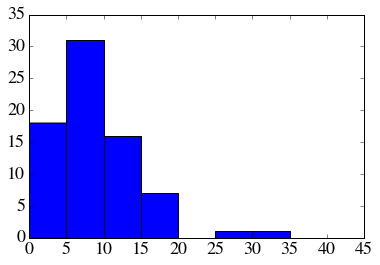

In [24]:
# I have a list for all the galaxies with spectra -- let's make urls for them!
# To do this (best), I need the size of the galaxy. So read in another file... 

dr12_ancillary = Table.read('../data/clumpy_coadd_imaging_highzgal_0.csv')

missing_spectra = [objid for objid in dr12_ancillary['OBJID'] if objid not in spectra_overview['OBJID']]
missing_idx = []
for missing in missing_spectra:
    missing_idx.append(np.where(dr12_ancillary['OBJID']==missing)[0][0])

mask = np.ones(len(dr12_ancillary), dtype='bool')
mask[missing_idx] = False

size = np.array([rad for rad in dr12_ancillary['petrorad_g'][mask]])
plt.hist(size, bins=np.arange(0,50,5))

urls = []
for r, d, s in zip(dr12_ancillary['ra'][mask],dr12_ancillary['dec'][mask],size):
    jpg = JC.jpegURL(ra=r, dec=d, width=300, height=300, options='SL')
    urls.append(jpg.url)
    #print jpg.url

spectra_overview['DR12url'] = urls
spectra_overview.colnames

## Create HTML file with GZH & my JPGs for comparison

In [26]:
spectra_overview_dr12 = join(spectra_overview, dr12_ancillary[mask], keys='OBJID')

In [28]:
with open('clumpy_coadd_imagecompare.html','w') as f:
    f.write("""<!doctype html>
<html>
<head>
    <title>Clumpy Galaxies: Coadd vs Single-Depth Imaging</title>
    <link rel="shortcut icon" href="../../img/favicon3.ico" type="image/x-icon">
    <meta http-equiv="Content-Type" content="text/html; charset=utf-8" />
</head>

<body>

<table><tr>
<td width=250 style="text-align:center;">Coadd Imaging</td>
<td width=250 style="text-align:center;">Single-Depth w/ Spectra boxes</td>
</tr></table>""")
    
    for gal in final_cc:
        if gal['OBJID'] in spectra_overview_dr12['OBJID']:
            f.write('<img src="{0}" height=250 width=250>\n'.format(gal['location']))
            
            single_url = spectra_overview_dr12['DR12url'][spectra_overview_dr12['OBJID'] == gal['OBJID']][0]
            f.write('<img src="{0}" height=250 width=250>\n'.format(single_url))
            
    f.write("""</body>
</html>""")

## Remove spectra that don't match the galaxy of interest
I cast a wide net to find all spectra for each galaxy which means, for the smaller ones, there will be some spectra from neighboring objects. Visually inspect the locations of these so as to remove extras

In [62]:
# This is the entire list of spectra grouped by galaxy coadd OBJID
# I went through each group, one by one, comparing the list of spectra in this table to the DR12 image with spectra boxes
# I marked any spectra that were of nearby objects instead of the clumpy galaxy at the center
gals.groups[75]

Name,Survey,PlateID,MJD,Fiber,RA,Dec,Redshift,ZWARNING,SN,Class
int64,string32,int64,int64,int64,float64,float64,float64,int64,float64,string48
8647475122540642445,SDSS,1242,52901,401,57.28304,1.16206,0.0136,0,13.16,GALAXY
8647475122540642445,SDSS,1529,52930,422,57.28387,1.16441,0.0137,0,11.61,GALAXY


In [31]:
to_remove = {'Name':[8647474690858942711, 8647474690881749069, 8647474690891186220,
                     8647474691427205226, 8647474691427205226, 8647474691428581676,
                     8647474691951296616, 8647474693020057675, 8647474693020057675,
                     8647474693040701887, 8647474693040701887, 8647475119814934833,
                     8647475120383263039, 8647475120924131439, 8647475120924131439,
                     8647475121457397936, 8647475121457529040, 8647475121466572880,
                     8647475121970348309,8647475121988567166], 
             
             'RA':[331.69794, 23.7141,45.2744,43.36315,43.36527,46.56047,14.16083,
                   2.79522,2.7926,49.94917,49.95014,322.81949,34.75315, 43.80031,
                   43.79049,35.62722,35.90876, 56.52248,340.9971,22.50797], 
             
             'Dec':[-0.69714,-0.65855,-0.74682,-0.22496,-0.23294,-0.34436,0.10867,
                    0.85132,0.85307,0.92993,0.93996,-0.87504,-0.59123,-0.17576,
                    -0.17782,0.38387, 0.22981,0.39538,0.68324,0.73664], 
             
             'Grp':[6,9,15,22,22,23,24,35,35,39,39,40,51,58,58,62,63,64,65,66]}

#remove ALL of group 34; not a clumpy galaxy -- superposition of 3 galaxies at different redshifts!
# MISSING spectra from 8647475120901062764 GRP 56, 351,08481, -0.107

In [64]:
to_remove_idx = []

# Remove ALL of group 34
not_clumpy = gals.groups[34]
for row in not_clumpy:
    bad_spec = np.where( (spectra['Name']==row['Name']) & 
                         (spectra['RA']==row['RA']) &
                         (spectra['Dec']==row['Dec'] ) )
    to_remove_idx.append(bad_spec[0][0])

# Remove the rest listed above
for i in range(20):
    bad_spec = np.where( (spectra['Name']==to_remove['Name'][i]) & 
                         (spectra['RA']==to_remove['RA'][i]) &
                         (spectra['Dec']==to_remove['Dec'][i]) )

    for idx in bad_spec[0]:
        to_remove_idx.append(idx)
        
bad_spec_mask = np.ones(len(spectra),dtype='bool')
bad_spec_mask[to_remove_idx] = False

good_spectra = spectra[bad_spec_mask]

# SAVE this new list for downloading the FITS files
good_spectra['PlateID','MJD', 'Fiber'].write('../data/clumpy_coadd_final75.csv')

## Use remaining spectra to get an AVG_Z for each galaxy

In [36]:
new_gals = good_spectra.group_by('Name')
new_gals

name = []
ra, dec = [], []
num_spectra, avg_z = [], []

for grp in new_gals.groups:
    name.append(grp['Name'][0])
    ra.append(grp['RA'][0])
    dec.append(grp['Dec'][0])
    num_spectra.append(len(grp))
    avg_z.append(np.mean(grp['Redshift']))
                 
good_spec_overview = Table(data=(name, ra,dec,num_spectra,avg_z,), 
                           names=('OBJID', 'ra', 'dec', 'NUM_SPEC', 'AVG_Z'))

## Combine all available information for the FINAL final clumpy coadd galaxy sample

In [54]:
# remove "group 34" from the url list
urls2 = urls[:34]+urls[35:]

# Add the url column to the good spec table
good_spec_overview['DR12url'] = urls2

# Join the FINAL final spectra overview list with the DR12 ancillary information
good_spec_overview_dr12 = join(good_spec_overview,dr12_ancillary,keys='OBJID')

# Finally, join it with the original GZH table 
good_spec_overview_dr12_gzh = join(good_spec_overview_dr12, final_cc, keys='OBJID')

# Now we have everything! Summary of avaialable spectra, GZH vote fractions, DR7 & DR12 ancillary info
# SAVE THIS CATALOG.
#good_spec_overview_dr12_gzh.write('../data/clumpy_coadd_spectra_dr12_gzh.fits',overwrite=True)

## Let's plot stuff again

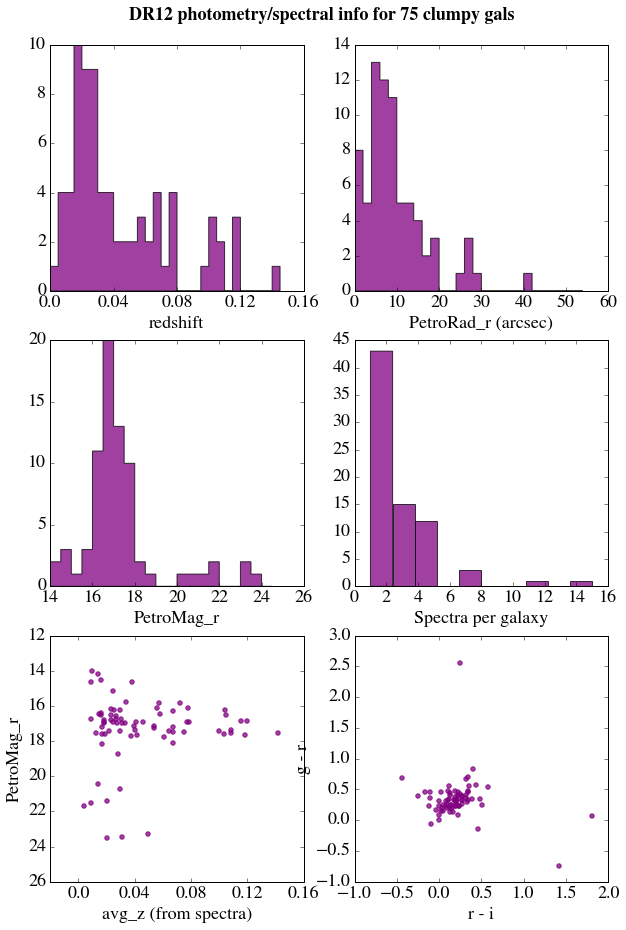

In [94]:
not_fucked = np.where(good_spec_overview_dr12_gzh['petroMag_g']>-9999)

# Sample distributions
fig = plt.figure(figsize=(10,15))

ax = fig.add_subplot(321)
ax.hist(good_spec_overview_dr12_gzh['AVG_Z'], bins=np.arange(0,.15,.005),
        histtype='stepfilled', color='purple', alpha=.75)
ax.set_xlabel('redshift')
ax.set_xticks([0., 0.04, 0.08, 0.12, 0.16])
ax.set_xticklabels(['0.0', '0.04', '0.08', '0.12', '0.16'])

ax.text(0.05, 11, 'DR12 photometry/spectral info for 75 clumpy gals',fontweight='bold')

ax = fig.add_subplot(322)
ax.hist(good_spec_overview_dr12_gzh['petrorad_r'], bins=np.arange(0,55,2),
        histtype='stepfilled', color='purple', alpha=0.75)
ax.set_xlabel('PetroRad_r (arcsec)')

ax = fig.add_subplot(323)
ax.hist(good_spec_overview_dr12_gzh['petroMag_r'][not_fucked], bins=np.arange(14,25,.5),
        histtype='stepfilled', color='purple', alpha=0.75)
ax.set_xlabel('PetroMag_r')

ax = fig.add_subplot(324)
ax.hist(good_spec_overview_dr12_gzh['NUM_SPEC'],color='purple', alpha=0.75)
ax.set_xlabel('Spectra per galaxy')

ax = fig.add_subplot(325)
ax.scatter(good_spec_overview_dr12_gzh['AVG_Z'][not_fucked], 
           good_spec_overview_dr12_gzh['petroMag_r'][not_fucked], 
           color='purple', alpha=0.75)
ax = plt.gca()
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xticks([0., 0.04, 0.08, 0.12, 0.16])
ax.set_xticklabels(['0.0', '0.04', '0.08', '0.12', '0.16'])
ax.set_xlabel('avg_z (from spectra)')
ax.set_ylabel('PetroMag_r')

gr = good_spec_overview_dr12_gzh['petroMag_g'] - good_spec_overview_dr12_gzh['petroMag_r']
ri = good_spec_overview_dr12_gzh['petroMag_r'] - good_spec_overview_dr12_gzh['petroMag_i']

ax = fig.add_subplot(326)
ax.scatter(ri, gr, color='purple', alpha=0.75)
ax.set_xlabel('r - i')
ax.set_ylabel('g - r')

plt.savefig('DR12_info_final75.png')

## Remarks:
Of the 76 galaxies with spectra, one of them is definitely not clumpy and was instead a juxtaposition of several galaxies at different redshifts, according to the spectra. It was rmoved. 

* Of the remaining 75 galaxies, most appear to be z < 0.04. 
* DR12 photometry shows that several of these are very dim and were only in the sample thanks to the coadd-depth. 
* most of the galaxies live in a tight region of color-color space (as expected) though a few outliers

Claudia suggest a redshift cut. I want to see what the z < 0.04 sample looks like. 

# Final Sample? 45 galaxies with z < 0.04

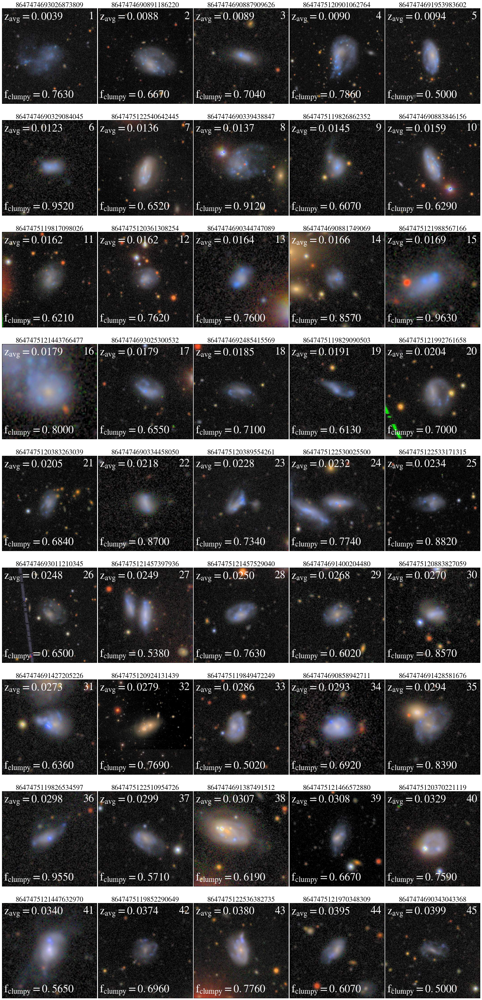

In [59]:
from display_jpegs import *

stuff = Table.read("""label    colname    value
                      f_{clumpy} t12_clumpy_a01_yes_weighted_fraction 0.5
                      z_{avg}   AVG_Z      0.04""", format='ascii')

low_z = good_spec_overview_dr12_gzh[good_spec_overview_dr12_gzh['AVG_Z']<=0.04]
show_jpegs(low_z, criteria=stuff, order_by='AVG_Z', image='location')

## Select out the spectra specific to the 45 galaxies selected above

In [89]:
# Save PlateID, MJD, Fiber for downloading just spectra for these 45
#good_spectra['PlateID','MJD','Fiber'][].write('../data/clumpy_coadd_lowz45.csv')
low_z['OBJID']
mask = np.array([True if objid in low_z['OBJID'] else False for objid in good_spectra['Name']])

good_spectra[mask].write('../data/clumpy_coadd_spectra_final45_fullspectrainfo.csv')
good_spectra['PlateID','MJD','Fiber'][mask].write('../data/clumpy_coadd_spectra_final45_minimal.csv')


## Here's what we'd be excluding (for now)

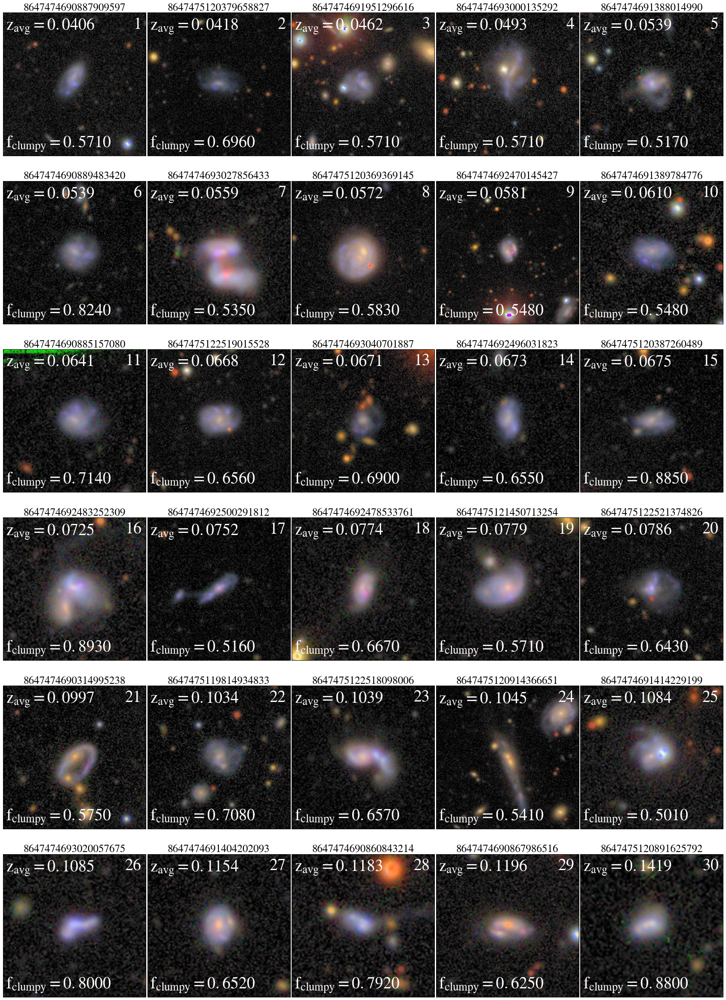

In [61]:
high_z = good_spec_overview_dr12_gzh[good_spec_overview_dr12_gzh['AVG_Z']>0.04]
show_jpegs(high_z, criteria=stuff, order_by='AVG_Z', image='location')